In [ ]:
!pip install kaggle opencv-python-headless matplotlib numpy scikit-image \
             albumentations Pillow torch torchvision timm einops \
             python-Levenshtein scikit-learn tqdm -q
print("All libraries installed")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.3/153.3 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 79.1 MB/s eta 0:00:00
All libraries installed


In [ ]:
from google.colab import files as colab_files
import os

uploaded = colab_files.upload()  # upload kaggle.json here
os.makedirs('/root/.kaggle', exist_ok=True)
!cp kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

!kaggle datasets download -d dataclusterlabs/indian-number-plates-dataset \
    --unzip -p /content/dataset/

print("✅ Dataset downloaded")
print("\nFolder structure:")
for root, dirs, flist in os.walk('/content/dataset'):
    for f in flist[:3]:
        print(" ", os.path.join(root, f))

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/dataclusterlabs/indian-number-plates-dataset
License(s): CC0-1.0
100% 145M/145M [00:00<00:00, 238MB/s]

✅ Dataset downloaded

Folder structure:
  /content/dataset/number_plate_annos_ocr/number_plate_annos_ocr/dc_license_plates_0RRPJCID3RRLSFTI.xml
  /content/dataset/number_plate_annos_ocr/number_plate_annos_ocr/dc_license_plates_2D9KWCA7PLD0NW31.xml
  /content/dataset/number_plate_annos_ocr/number_plate_annos_ocr/dc_license_plates_3HE1J0YIRGRDENVO.xml
  /content/dataset/number_plate_images_ocr/number_plate_images_ocr/dc_tempo_van__image_000490_CF9bwJsyoX.jpg
  /content/dataset/number_plate_images_ocr/number_plate_images_ocr/dc_bus_image_000039_9NispLHmAo.jpg
  /content/dataset/number_plate_images_ocr/number_plate_images_ocr/dc_license_plates_0RBAQHKIXQMDFYZD.jpg
  /content/dataset/Annotations/Annotations/Datacluster_number_plates (36).xml
  /content/dataset/Annotations/Annotations/Datacluster_number_plates (

Total images found: 47

  Train :   32  (68.1%)
  Val   :    7  (14.9%)
  Test  :    8  (17.0%)


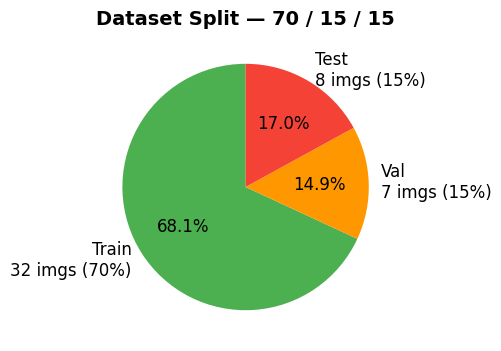

Split done and visualised


In [ ]:
import glob, random, shutil
import numpy as np
import cv2
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

# ── Collect every image ──────────────────────────────────────────
all_images = sorted(
    glob.glob('/content/dataset/**/*.jpg',  recursive=True) +
    glob.glob('/content/dataset/**/*.jpeg', recursive=True) +
    glob.glob('/content/dataset/**/*.png',  recursive=True)
)
random.seed(42)
random.shuffle(all_images)
print(f"Total images found: {len(all_images)}")

# ── Split ────────────────────────────────────────────────────────
train_imgs, temp_imgs = train_test_split(all_images, test_size=0.30, random_state=42)
val_imgs,   test_imgs = train_test_split(temp_imgs,  test_size=0.50, random_state=42)

print(f"\n  Train : {len(train_imgs):>4}  ({len(train_imgs)/len(all_images)*100:.1f}%)")
print(f"  Val   : {len(val_imgs):>4}  ({len(val_imgs)/len(all_images)*100:.1f}%)")
print(f"  Test  : {len(test_imgs):>4}  ({len(test_imgs)/len(all_images)*100:.1f}%)")

# ── Copy into split folders ──────────────────────────────────────
for split, paths in [('train', train_imgs), ('val', val_imgs), ('test', test_imgs)]:
    os.makedirs(f'/content/splits/{split}', exist_ok=True)
    for p in paths:
        shutil.copy(p, f'/content/splits/{split}/')

# ── Pie chart ────────────────────────────────────────────────────
sizes  = [len(train_imgs), len(val_imgs), len(test_imgs)]
labels = [f'Train\n{len(train_imgs)} imgs (70%)',
          f'Val\n{len(val_imgs)} imgs (15%)',
          f'Test\n{len(test_imgs)} imgs (15%)']
colors = ['#4CAF50', '#FF9800', '#F44336']

plt.figure(figsize=(4, 4))
plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%',
        startangle=90, textprops={'fontsize': 12})
plt.title('Dataset Split — 70 / 15 / 15', fontsize=14, fontweight='bold')
os.makedirs('/content/outputs', exist_ok=True)
plt.savefig('/content/outputs/00_dataset_split.png', dpi=150, bbox_inches='tight')
plt.show()
print("Split done and visualised")

In [ ]:
def show(images, titles, figsize=(20, 5), save_name=None):
    os.makedirs('/content/outputs', exist_ok=True)
    plt.figure(figsize=figsize)
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        if len(img.shape) == 2:
            plt.imshow(img, cmap='gray')
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(title, fontsize=11, fontweight='bold')
        plt.axis('off')
    plt.tight_layout()
    fname = (save_name or titles[0]).replace(' ', '_').replace('/', '_')
    out = f'/content/outputs/{fname}.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved: {out}")

Image: /content/dataset/Indian_Number_Plates/Sample_Images/Datacluster_number_plates (99).jpg  |  Shape: (600, 800, 3)


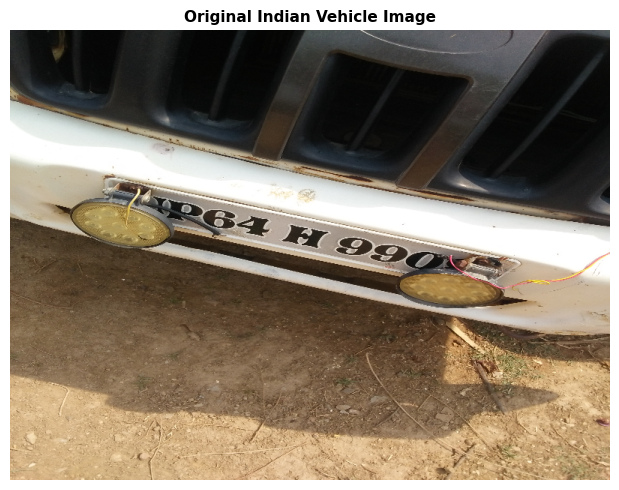

✅ Saved: /content/outputs/01_original.png


In [ ]:
img_path = train_imgs[0]
original = cv2.imread(img_path)
original = cv2.resize(original, (800, 600))
print(f"Image: {img_path}  |  Shape: {original.shape}")
show([original], ['Original Indian Vehicle Image'], save_name='01_original')

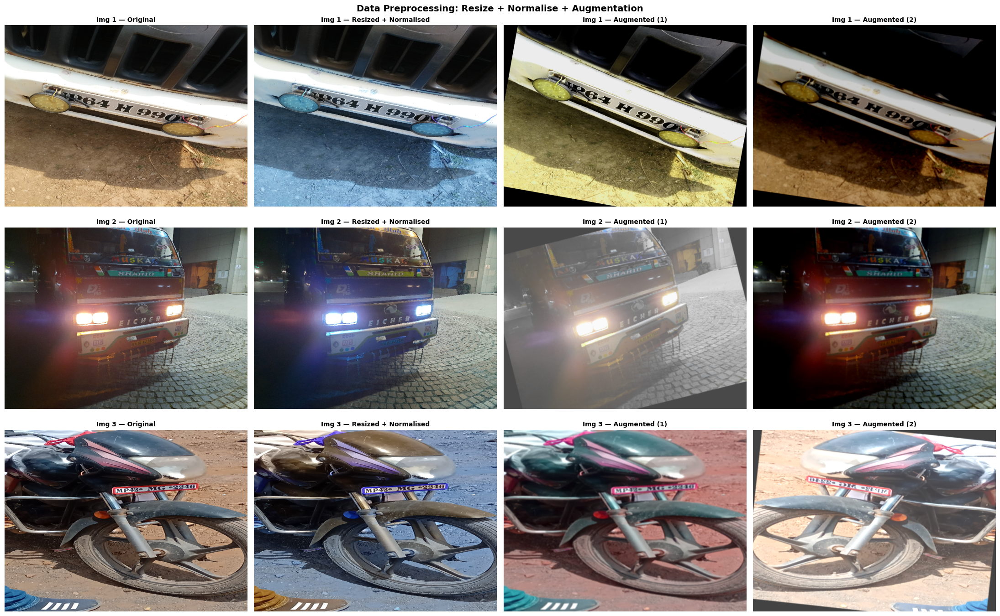

✅ Preprocessing + augmentation verified on 3 training images


In [ ]:
import albumentations as A

# ── Augmentation pipeline (rotation + blur + brightness) ─────────
augment_pipeline = A.Compose([
    A.Rotate(limit=15, border_mode=cv2.BORDER_CONSTANT, p=0.6),
    A.GaussianBlur(blur_limit=(3, 7), p=0.5),
    A.RandomBrightnessContrast(
        brightness_limit=0.35,
        contrast_limit=0.35,
        p=0.6
    ),
    A.HueSaturationValue(
        hue_shift_limit=10,
        sat_shift_limit=20,
        val_shift_limit=20,
        p=0.3
    ),
    A.HorizontalFlip(p=0.3),
    A.Resize(600, 800),
])

def preprocess_image(img_bgr):
    """Resize to 800x600 and normalize to [0,1]."""
    resized    = cv2.resize(img_bgr, (800, 600))
    normalized = resized.astype(np.float32) / 255.0
    return resized, normalized

def augment_image(img_bgr):
    """Apply augmentation pipeline."""
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    aug     = augment_pipeline(image=img_rgb)['image']
    return aug

# ── Demonstrate on 3 images ──────────────────────────────────────
fig, axes = plt.subplots(3, 4, figsize=(22, 14))
aug_types = ['Original', 'Resized + Normalised', 'Augmented (1)', 'Augmented (2)']

for row, path in enumerate(train_imgs[:3]):
    img     = cv2.imread(path)
    img     = cv2.resize(img, (800, 600))
    resized, norm = preprocess_image(img)
    aug1    = augment_image(img)
    aug2    = augment_image(img)

    imgs_row = [
        cv2.cvtColor(img, cv2.COLOR_BGR2RGB),
        (norm * 255).astype(np.uint8),
        aug1,
        aug2,
    ]
    for col, (show_img, title) in enumerate(zip(imgs_row, aug_types)):
        axes[row][col].imshow(show_img)
        axes[row][col].set_title(f'Img {row+1} — {title}', fontsize=10, fontweight='bold')
        axes[row][col].axis('off')

plt.suptitle('Data Preprocessing: Resize + Normalise + Augmentation',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/outputs/02_preprocessing_augmentation.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Preprocessing + augmentation verified on 3 training images")

Train batches : 2
Val   batches : 1
Test  batches : 1

Sample batch shape : torch.Size([16, 3, 224, 224])
Sample labels shape: torch.Size([16])
Pixel range after normalize: [-2.12, 2.64]


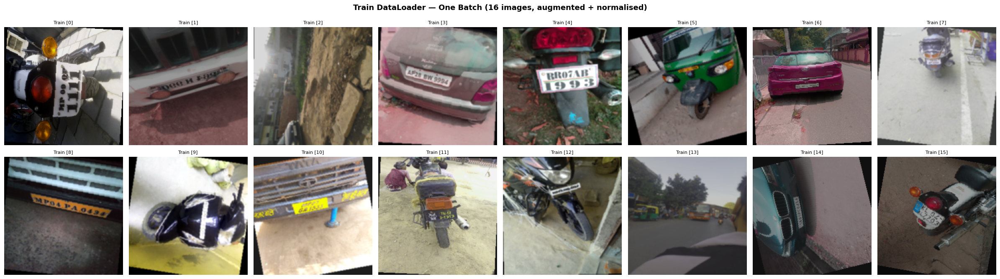

✅ DataLoaders ready


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image

class NumberPlateDataset(Dataset):
    """
    PyTorch Dataset for Indian Number Plates.
    Applies augmentation on train split, only resize+normalize on val/test.
    """
    def __init__(self, image_paths, split='train', img_size=(224, 224)):
        self.image_paths = image_paths
        self.split       = split
        self.img_size    = img_size

        # Train: augmentation + normalize
        # Val / Test: only resize + normalize
        if split == 'train':
            self.transform = transforms.Compose([
                transforms.Resize(img_size),
                transforms.RandomHorizontalFlip(p=0.3),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(
                    brightness=0.35,
                    contrast=0.35,
                    saturation=0.2,
                    hue=0.1
                ),
                transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],   # ImageNet stats (ResNet standard)
                    std= [0.229, 0.224, 0.225]
                ),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize(img_size),
                transforms.ToTensor(),
                transforms.Normalize(
                    mean=[0.485, 0.456, 0.406],
                    std= [0.229, 0.224, 0.225]
                ),
            ])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        path = self.image_paths[idx]
        try:
            img = Image.open(path).convert('RGB')
        except Exception:
            img = Image.new('RGB', self.img_size, (128, 128, 128))
        img = self.transform(img)
        # Label = 0 placeholder (real labels need annotation file)
        return img, torch.tensor(0, dtype=torch.long)

# ── Build datasets ───────────────────────────────────────────────
train_dataset = NumberPlateDataset(train_imgs, split='train')
val_dataset   = NumberPlateDataset(val_imgs,   split='val')
test_dataset  = NumberPlateDataset(test_imgs,  split='test')

# ── Build DataLoaders ────────────────────────────────────────────
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=2)

print(f"Train batches : {len(train_loader)}")
print(f"Val   batches : {len(val_loader)}")
print(f"Test  batches : {len(test_loader)}")

# ── Verify one batch ─────────────────────────────────────────────
sample_batch, sample_labels = next(iter(train_loader))
print(f"\nSample batch shape : {sample_batch.shape}")   # [16, 3, 224, 224]
print(f"Sample labels shape: {sample_labels.shape}")
print(f"Pixel range after normalize: [{sample_batch.min():.2f}, {sample_batch.max():.2f}]")

# ── Visualise one batch (un-normalise for display) ───────────────
mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

fig, axes = plt.subplots(2, 8, figsize=(24, 7))
for i in range(min(16, sample_batch.size(0))):
    img_disp = (sample_batch[i] * std + mean).clamp(0, 1).permute(1,2,0).numpy()
    r, c = divmod(i, 8)
    axes[r][c].imshow(img_disp)
    axes[r][c].set_title(f'Train [{i}]', fontsize=8)
    axes[r][c].axis('off')

plt.suptitle('Train DataLoader — One Batch (16 images, augmented + normalised)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/outputs/03_train_batch.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ DataLoaders ready")

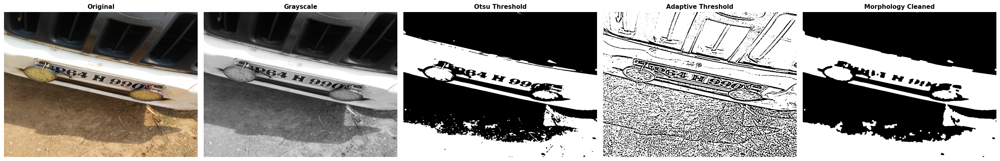

✅ Saved: /content/outputs/04_thresholding.png


In [ ]:
def thresholding_segmentation(img):
    gray     = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur     = cv2.GaussianBlur(gray, (5,5), 0)

    # Otsu — global threshold for bright plate regions
    _, otsu  = cv2.threshold(blur, 0, 255,
                              cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Adaptive — handles uneven illumination
    adaptive = cv2.adaptiveThreshold(blur, 255,
                                      cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                      cv2.THRESH_BINARY, 11, 2)

    # Morphological cleanup
    kernel  = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    cleaned = cv2.morphologyEx(otsu, cv2.MORPH_CLOSE, kernel)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_OPEN,  kernel)

    return gray, otsu, adaptive, cleaned

gray, otsu_t, adaptive_t, cleaned_t = thresholding_segmentation(original)
show(
    [original, gray, otsu_t, adaptive_t, cleaned_t],
    ['Original', 'Grayscale', 'Otsu Threshold',
     'Adaptive Threshold', 'Morphology Cleaned'],
    figsize=(25,5), save_name='04_thresholding'
)

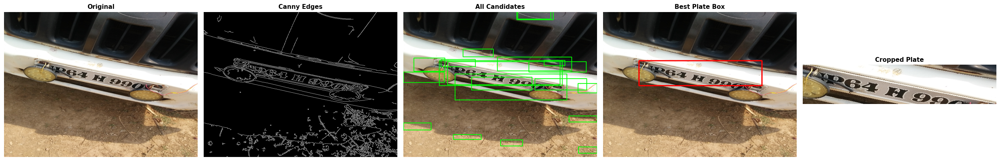

✅ Saved: /content/outputs/05_canny_segmentation.png


In [ ]:
def canny_segmentation(img):
    gray  = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur  = cv2.GaussianBlur(gray, (5,5), 0)
    edges = cv2.Canny(blur, 50, 150)

    contours, _ = cv2.findContours(edges, cv2.RETR_TREE,
                                    cv2.CHAIN_APPROX_SIMPLE)

    # Filter: Indian plates are roughly 3:1 to 6:1 aspect ratio
    candidates = []
    for cnt in contours:
        x, y, w, h = cv2.boundingRect(cnt)
        ar   = w / float(h) if h > 0 else 0
        area = w * h
        if 2.0 < ar < 7.0 and 1500 < area < 60000:
            candidates.append((x, y, w, h))

    cand_img = img.copy()
    for (x, y, w, h) in candidates:
        cv2.rectangle(cand_img, (x,y), (x+w,y+h), (0,255,0), 2)

    best_plate = None
    best_img   = img.copy()
    if candidates:
        x, y, w, h = max(candidates, key=lambda c: c[2]*c[3])
        cv2.rectangle(best_img, (x,y), (x+w,y+h), (0,0,255), 3)
        best_plate = img[y:y+h, x:x+w]

    return edges, cand_img, best_img, best_plate

edges, cand_img, best_img, plate_crop = canny_segmentation(original)

imgs   = [original, edges, cand_img, best_img]
titles = ['Original', 'Canny Edges', 'All Candidates', 'Best Plate Box']
if plate_crop is not None and plate_crop.size > 0:
    imgs.append(plate_crop)
    titles.append('Cropped Plate')

show(imgs, titles, figsize=(25,5), save_name='05_canny_segmentation')

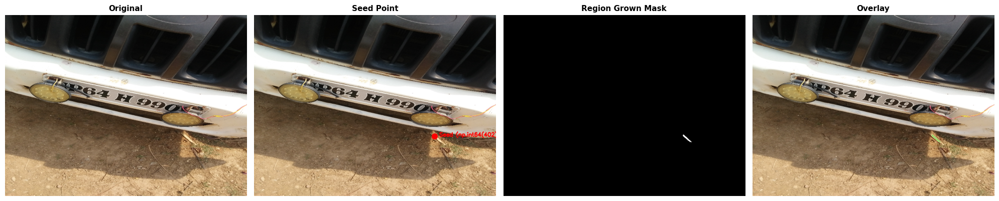

✅ Saved: /content/outputs/06_region_growing.png


In [ ]:
def region_growing(img, threshold=25):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    h, w = blur.shape

    # Auto-seed: brightest spot in lower-centre (plates sit here)
    roi       = blur[h//2:, w//4: 3*w//4]
    local_max = np.unravel_index(np.argmax(roi), roi.shape)
    seed      = (local_max[0] + h//2, local_max[1] + w//4)

    visited  = np.zeros_like(blur, dtype=bool)
    region   = np.zeros_like(blur, dtype=np.uint8)
    stack    = [seed]
    seed_val = int(blur[seed[0], seed[1]])

    while stack:
        py, px = stack.pop()
        if visited[py, px]:
            continue
        visited[py, px] = True
        if abs(int(blur[py, px]) - seed_val) <= threshold:
            region[py, px] = 255
            for dy, dx in [(-1,0),(1,0),(0,-1),(0,1)]:
                ny, nx = py+dy, px+dx
                if 0 <= ny < h and 0 <= nx < w and not visited[ny,nx]:
                    stack.append((ny, nx))

    seed_img = img.copy()
    cv2.circle(seed_img, (seed[1], seed[0]), 10, (0,0,255), -1)
    cv2.putText(seed_img, f'Seed {seed}',
                (seed[1]+15, seed[0]),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,255), 2)

    overlay = img.copy()
    overlay[region == 255] = [0, 200, 0]
    blended = cv2.addWeighted(img, 0.6, overlay, 0.4, 0)

    return region, seed_img, blended

region_mask, seed_img, region_overlay = region_growing(original)
show(
    [original, seed_img, region_mask, region_overlay],
    ['Original', f'Seed Point', 'Region Grown Mask', 'Overlay'],
    figsize=(20,5), save_name='06_region_growing'
)

Harris corners detected: 8686


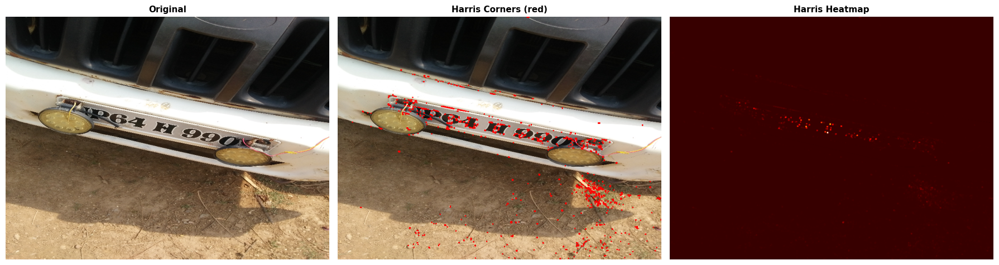

✅ Saved: /content/outputs/07_harris_corners.png


In [ ]:
def harris_corners(img):
    gray   = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray_f = np.float32(gray)
    harris = cv2.cornerHarris(gray_f, blockSize=2, ksize=3, k=0.04)
    harris = cv2.dilate(harris, None)

    result = img.copy()
    result[harris > 0.01 * harris.max()] = [0, 0, 255]

    coords = np.argwhere(harris > 0.01 * harris.max())
    print(f"Harris corners detected: {len(coords)}")

    hmap = cv2.normalize(harris, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)
    hmap = cv2.applyColorMap(hmap, cv2.COLORMAP_HOT)
    return result, hmap, coords

harris_img, harris_hmap, harris_coords = harris_corners(original)
show(
    [original, harris_img, harris_hmap],
    ['Original', 'Harris Corners (red)', 'Harris Heatmap'],
    figsize=(18,5), save_name='07_harris_corners'
)

Gray shape       : (600, 800)
Det shape (raw)  : (3, 600, 800)
Det shape (fixed): (3, 600)
Strong shape     : (3, 600)
Coords shape     : (1795, 2)
Hessian responses: 1795
Hmap_gray shape  : (3, 600)


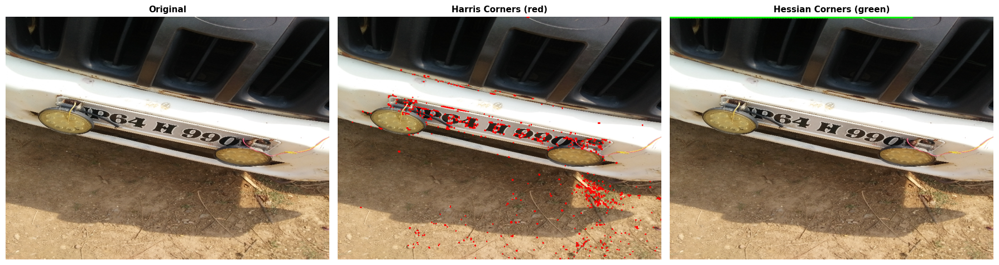

✅ Saved: /content/outputs/08_harris_vs_hessian.png


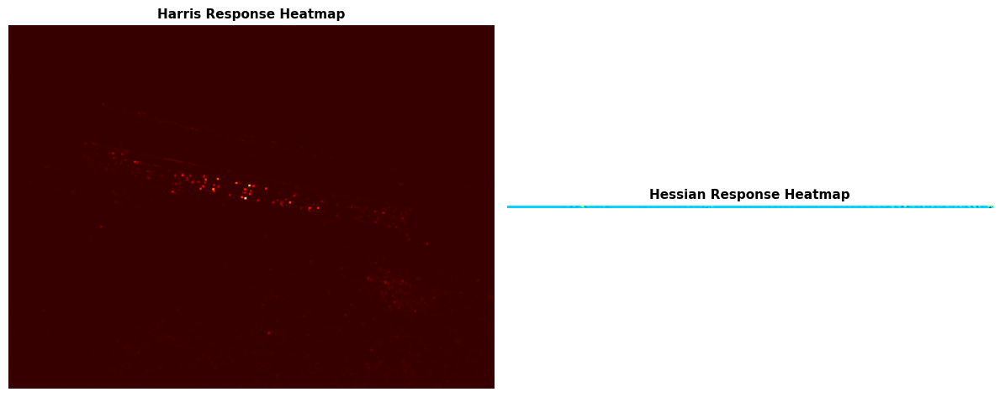

✅ Saved: /content/outputs/09_corner_heatmaps.png


In [ ]:
from skimage.feature import hessian_matrix, hessian_matrix_det
from skimage.color import rgb2gray as sk_rgb2gray
from skimage import img_as_float

def hessian_corners(img):
    # Convert BGR → grayscale float 2D
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray    = img_as_float(sk_rgb2gray(img_rgb))
    print(f"Gray shape       : {gray.shape}")   # should be (H, W)

    # Hessian matrix
    H_elem = hessian_matrix(gray, sigma=1.5, order='rc',
                             use_gaussian_derivatives=False)

    # Determinant — force to 2D
    det = hessian_matrix_det(H_elem)
    print(f"Det shape (raw)  : {det.shape}")

    # If det came out 3D, squeeze it to 2D
    if det.ndim == 3:
        det = det[:, :, 0]
    print(f"Det shape (fixed): {det.shape}")    # should be (H, W)

    # Normalize to [0, 1]
    det_norm = (det - det.min()) / (det.max() - det.min() + 1e-8)

    # Threshold
    strong = det_norm > 0.25
    print(f"Strong shape     : {strong.shape}") # should be (H, W)

    # Get corner coordinates — now guaranteed 2D → argwhere gives (N, 2)
    coords = np.argwhere(strong)
    print(f"Coords shape     : {coords.shape}") # should be (N, 2)
    print(f"Hessian responses: {len(coords)}")

    # Draw corners
    result = img.copy()
    for pt in coords[::4]:
        r, c = int(pt[0]), int(pt[1])
        cv2.circle(result, (c, r), 2, (0, 255, 0), -1)

    # Heatmap — det_norm is now guaranteed 2D
    hmap_gray = (det_norm * 255).astype(np.uint8)
    print(f"Hmap_gray shape  : {hmap_gray.shape}") # must be (H, W)
    hmap = cv2.applyColorMap(hmap_gray, cv2.COLORMAP_JET)

    return result, hmap, coords

# Run
hessian_img, hessian_hmap, hessian_coords = hessian_corners(original)

# Harris vs Hessian
show(
    [original, harris_img, hessian_img],
    ['Original', 'Harris Corners (red)', 'Hessian Corners (green)'],
    figsize=(18, 5),
    save_name='08_harris_vs_hessian'
)

# Heatmaps
show(
    [harris_hmap, hessian_hmap],
    ['Harris Response Heatmap', 'Hessian Response Heatmap'],
    figsize=(12, 5),
    save_name='09_corner_heatmaps'
)


FULL CV PIPELINE: sample_01
✅ Refined box: (0,0) → (507,102)


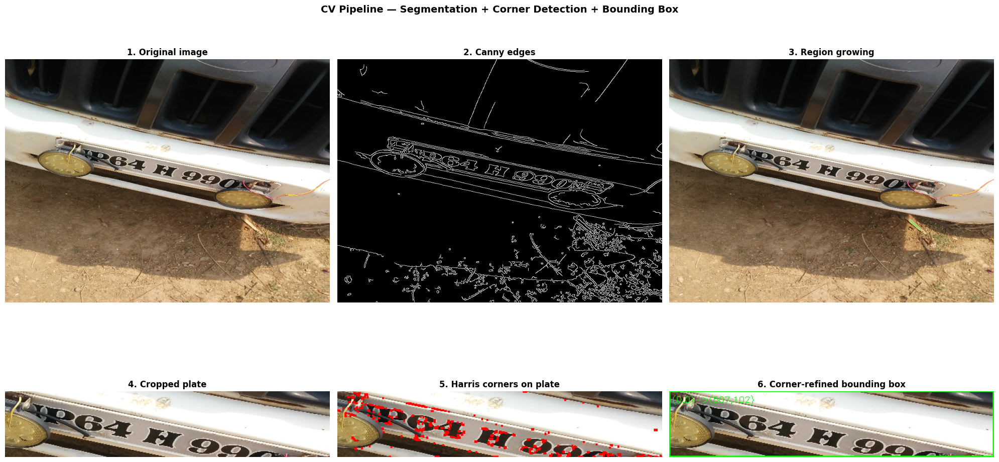

✅ Saved: /content/outputs/pipeline_sample_01.png


In [ ]:
def full_cv_pipeline(img, img_name='output'):
    print(f"\n{'='*55}\nFULL CV PIPELINE: {img_name}\n{'='*55}")

    # Step 1 — Canny segmentation → plate crop
    edges, _, _, plate_crop = canny_segmentation(img)
    if plate_crop is None or plate_crop.size == 0:
        print("Canny found no plate, using full image")
        plate_crop = img.copy()

    # Step 2 — Harris corners on plate
    plate_gray = np.float32(cv2.cvtColor(plate_crop, cv2.COLOR_BGR2GRAY))
    harris     = cv2.dilate(cv2.cornerHarris(plate_gray, 2, 3, 0.04), None)
    corners_img = plate_crop.copy()
    mask        = harris > 0.01 * harris.max()
    corners_img[mask] = [0, 0, 255]

    # Step 3 — Refine bounding box from corner coordinates
    refined_img = plate_crop.copy()
    coords      = np.argwhere(mask)
    if len(coords) > 4:
        ys, xs  = coords[:,0], coords[:,1]
        x0,x1   = int(xs.min()), int(xs.max())
        y0,y1   = int(ys.min()), int(ys.max())
        cv2.rectangle(refined_img, (x0,y0), (x1,y1), (0,255,0), 2)
        cv2.putText(refined_img,
                    f'({x0},{y0})->({x1},{y1})',
                    (4, 18), cv2.FONT_HERSHEY_SIMPLEX, 0.45, (0,255,0), 1)
        print(f"✅ Refined box: ({x0},{y0}) → ({x1},{y1})")
    else:
        print("Not enough corners for box refinement")

    # Step 4 — Region growing overlay
    _, _, region_overlay = region_growing(img)

    # 2×3 summary figure
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    panels = [
        (img,            '1. Original image'),
        (edges,          '2. Canny edges'),
        (region_overlay, '3. Region growing'),
        (plate_crop,     '4. Cropped plate'),
        (corners_img,    '5. Harris corners on plate'),
        (refined_img,    '6. Corner-refined bounding box'),
    ]
    for ax, (pimg, ptitle) in zip(axes.flatten(), panels):
        ax.imshow(pimg if len(pimg.shape)==2
                  else cv2.cvtColor(pimg, cv2.COLOR_BGR2RGB),
                  cmap='gray' if len(pimg.shape)==2 else None)
        ax.set_title(ptitle, fontsize=12, fontweight='bold')
        ax.axis('off')

    plt.suptitle('CV Pipeline — Segmentation + Corner Detection + Bounding Box',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    out = f'/content/outputs/pipeline_{img_name}.png'
    plt.savefig(out, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"✅ Saved: {out}")

full_cv_pipeline(original, 'sample_01')


FULL CV PIPELINE: sample_01
✅ Refined box: (0,0) → (307,143)


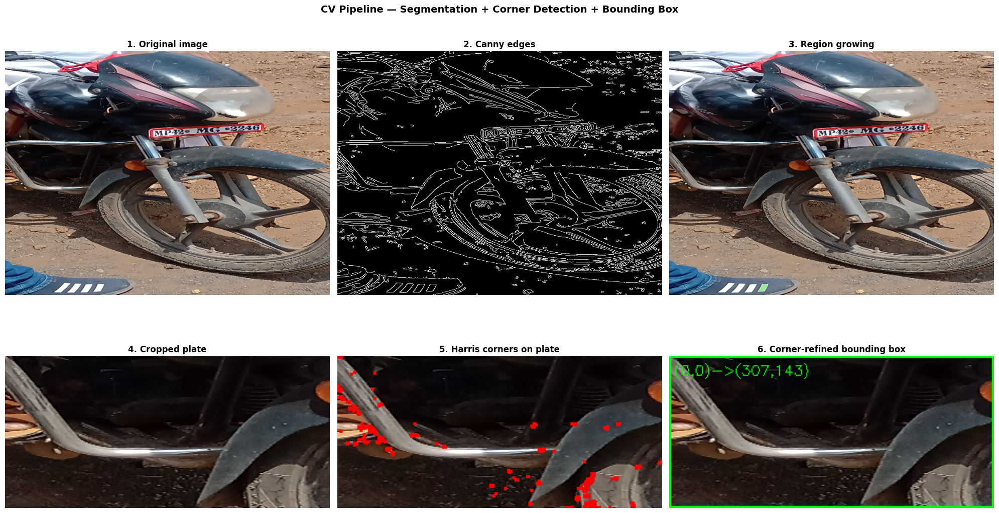

✅ Saved: /content/outputs/pipeline_sample_01.png

FULL CV PIPELINE: sample_02
✅ Refined box: (0,0) → (308,126)


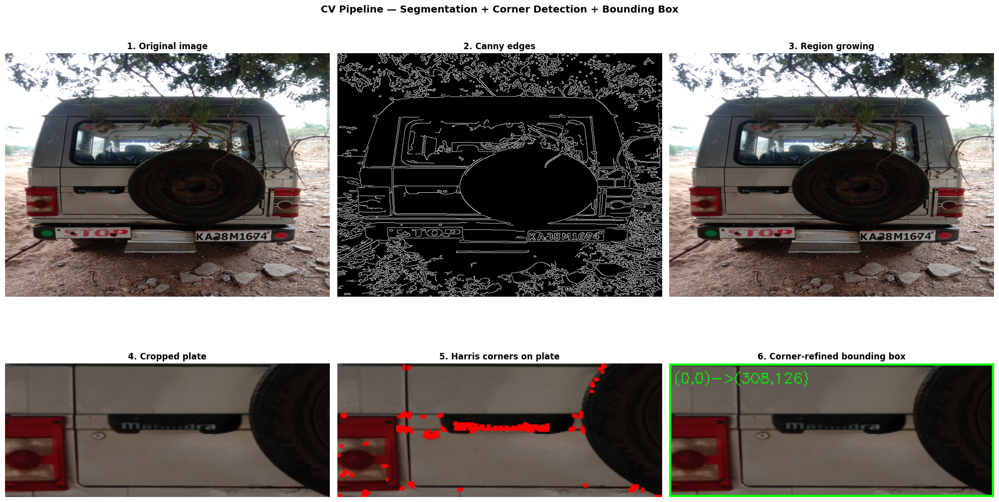

✅ Saved: /content/outputs/pipeline_sample_02.png

FULL CV PIPELINE: sample_03
✅ Refined box: (9,2) → (156,23)


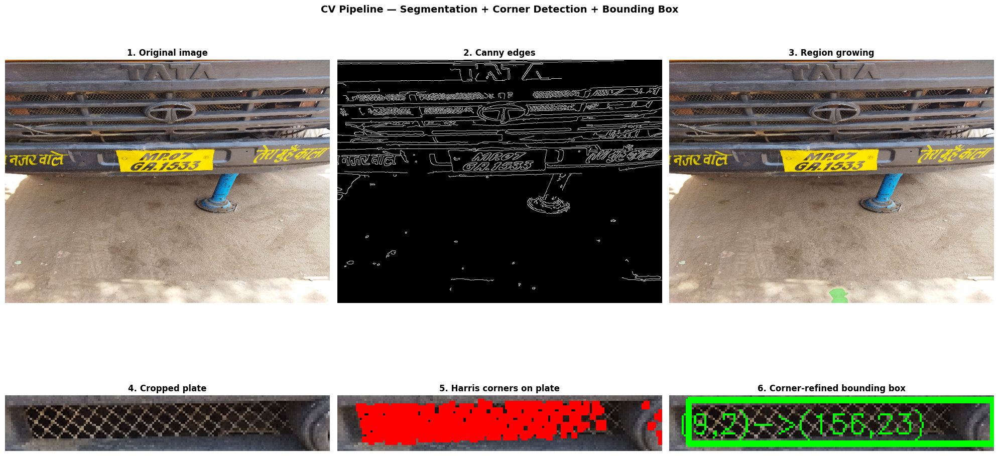

✅ Saved: /content/outputs/pipeline_sample_03.png

FULL CV PIPELINE: sample_04
✅ Refined box: (1,0) → (167,84)


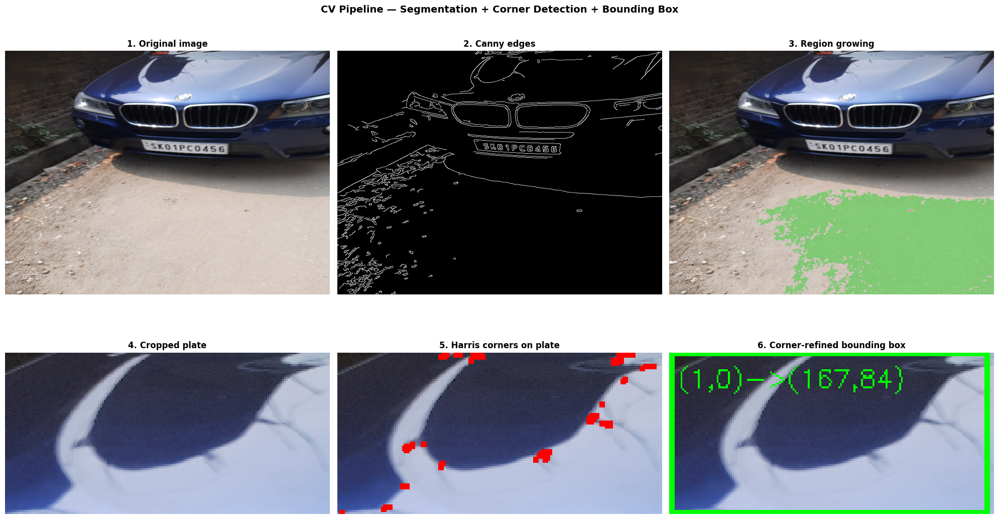

✅ Saved: /content/outputs/pipeline_sample_04.png

FULL CV PIPELINE: sample_05
✅ Refined box: (0,0) → (277,73)


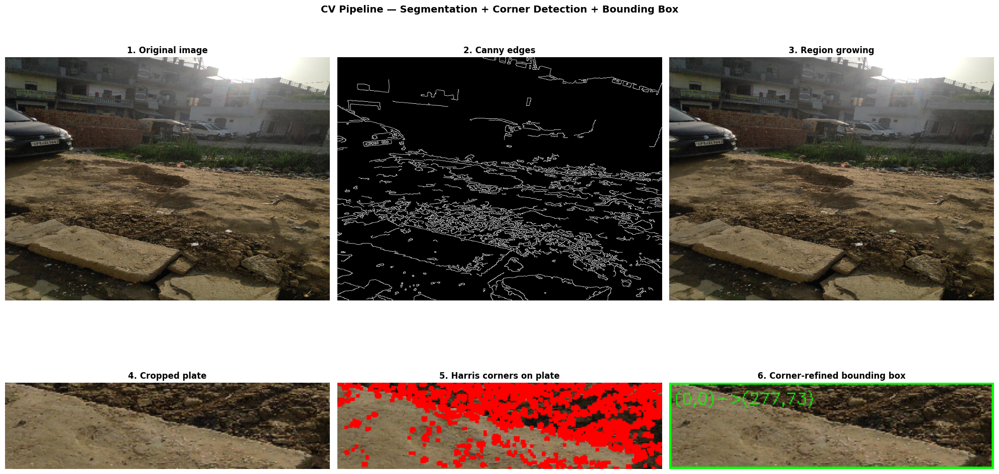

✅ Saved: /content/outputs/pipeline_sample_05.png


In [ ]:
for i, path in enumerate(random.sample(train_imgs, min(5, len(train_imgs)))):
    img = cv2.resize(cv2.imread(path), (800, 600))
    full_cv_pipeline(img, f'sample_{i+1:02d}')

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

class ResNetBackbone(nn.Module):
    """
    ResNet-50 pretrained on ImageNet.
    We remove the final FC layer and use it as a feature extractor.
    Output: feature map of shape [B, 2048, 7, 7] for 224x224 input.
    """
    def __init__(self, pretrained=True):
        super().__init__()
        base      = models.resnet50(weights='IMAGENET1K_V1' if pretrained else None)
        # Keep everything except avgpool + fc
        self.features = nn.Sequential(*list(base.children())[:-2])
        self.pool     = nn.AdaptiveAvgPool2d((1, 1))

    def forward(self, x):
        feat_map = self.features(x)          # [B, 2048, 7, 7]
        pooled   = self.pool(feat_map)        # [B, 2048, 1, 1]
        pooled   = pooled.flatten(1)          # [B, 2048]
        return feat_map, pooled

backbone = ResNetBackbone(pretrained=True).to(device)

# Quick test
with torch.no_grad():
    dummy         = torch.randn(2, 3, 224, 224).to(device)
    feat_map, vec = backbone(dummy)
    print(f"Feature map shape : {feat_map.shape}")   # [2, 2048, 7, 7]
    print(f"Pooled vector shape: {vec.shape}")        # [2, 2048]
print("✅ ResNet-50 backbone ready")

Device: cuda
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 145MB/s]


Feature map shape : torch.Size([2, 2048, 7, 7])
Pooled vector shape: torch.Size([2, 2048])
✅ ResNet-50 backbone ready


In [ ]:
import math

class PositionalEncoding(nn.Module):
    """Standard sinusoidal positional encoding."""
    def __init__(self, d_model, max_len=512, dropout=0.1):
        super().__init__()
        self.dropout = nn.Dropout(dropout)
        pe = torch.zeros(max_len, d_model)
        pos = torch.arange(max_len).unsqueeze(1).float()
        div = torch.exp(torch.arange(0, d_model, 2).float()
                        * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(pos * div)
        pe[:, 1::2] = torch.cos(pos * div)
        self.register_buffer('pe', pe.unsqueeze(0))  # [1, max_len, d_model]

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)]
        return self.dropout(x)


class PlateTransformer(nn.Module):
    """
    CNN (ResNet-50) + Transformer encoder-decoder for
    number plate character sequence prediction.

    Architecture:
      1. ResNet-50 extracts spatial feature map  [B, 2048, H, W]
      2. 1×1 conv projects to d_model            [B, d_model, H, W]
      3. Flatten spatial → sequence              [B, H*W, d_model]
      4. Positional encoding
      5. Transformer encoder (self-attention over spatial tokens)
      6. Transformer decoder (predicts character sequence)
      7. Linear head → vocab logits
    """
    def __init__(self,
                 vocab_size=38,      # 0-9 + A-Z + blank + <sos>
                 d_model=256,
                 nhead=8,
                 num_enc_layers=3,
                 num_dec_layers=3,
                 max_seq_len=10,     # max plate length
                 dropout=0.1):
        super().__init__()
        self.vocab_size  = vocab_size
        self.max_seq_len = max_seq_len
        self.d_model     = d_model

        # ── CNN backbone ────────────────────────────────────────
        self.backbone = ResNetBackbone(pretrained=True)
        # Freeze early layers, fine-tune later layers
        for name, param in self.backbone.features[:6].named_parameters():
            param.requires_grad = False

        # ── Project 2048 → d_model ───────────────────────────
        self.proj = nn.Sequential(
            nn.Conv2d(2048, d_model, kernel_size=1),
            nn.BatchNorm2d(d_model),
            nn.ReLU(),
        )

        # ── Positional encoding ──────────────────────────────
        self.pos_enc = PositionalEncoding(d_model, dropout=dropout)

        # ── Transformer ──────────────────────────────────────
        enc_layer = nn.TransformerEncoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=d_model*4,
            dropout=dropout, batch_first=True
        )
        self.transformer_enc = nn.TransformerEncoder(enc_layer, num_layers=num_enc_layers)

        dec_layer = nn.TransformerDecoderLayer(
            d_model=d_model, nhead=nhead,
            dim_feedforward=d_model*4,
            dropout=dropout, batch_first=True
        )
        self.transformer_dec = nn.TransformerDecoder(dec_layer, num_layers=num_dec_layers)

        # ── Target embedding (decoder input) ─────────────────
        self.tgt_embed = nn.Embedding(vocab_size, d_model)

        # ── Output head ──────────────────────────────────────
        self.fc_out = nn.Linear(d_model, vocab_size)

    def encode(self, x):
        feat_map, _ = self.backbone(x)           # [B, 2048, 7, 7]
        feat         = self.proj(feat_map)        # [B, d_model, 7, 7]
        B, C, H, W   = feat.shape
        # Flatten spatial dims → sequence
        seq          = feat.flatten(2).permute(0, 2, 1)  # [B, H*W, d_model]
        seq          = self.pos_enc(seq)
        memory       = self.transformer_enc(seq)          # [B, H*W, d_model]
        return memory

    def decode(self, tgt, memory):
        tgt_emb = self.tgt_embed(tgt)             # [B, T, d_model]
        tgt_emb = self.pos_enc(tgt_emb)
        # Causal mask so decoder doesn't peek ahead
        T       = tgt.size(1)
        tgt_mask = nn.Transformer.generate_square_subsequent_mask(T).to(tgt.device)
        out     = self.transformer_dec(tgt_emb, memory,
                                        tgt_mask=tgt_mask)  # [B, T, d_model]
        logits  = self.fc_out(out)                # [B, T, vocab_size]
        return logits

    def forward(self, x, tgt):
        memory = self.encode(x)
        logits = self.decode(tgt, memory)
        return logits


# ── Build model ──────────────────────────────────────────────────
model = PlateTransformer(
    vocab_size    = 38,
    d_model       = 256,
    nhead         = 8,
    num_enc_layers= 3,
    num_dec_layers= 3,
    max_seq_len   = 10,
).to(device)

total_params     = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Total parameters    : {total_params:,}")
print(f"Trainable parameters: {trainable_params:,}")

# ── Sanity-check forward pass ─────────────────────────────────
with torch.no_grad():
    dummy_img = torch.randn(4, 3, 224, 224).to(device)
    dummy_tgt = torch.randint(0, 38, (4, 10)).to(device)
    logits    = model(dummy_img, dummy_tgt)
    print(f"\nForward pass output shape: {logits.shape}")  # [4, 10, 38]
print("✅ CNN + Transformer model built")

Total parameters    : 29,582,182
Trainable parameters: 28,137,254

Forward pass output shape: torch.Size([4, 10, 38])
✅ CNN + Transformer model built


In [ ]:
# CELL — Check what annotations actually exist
import os, glob

# Check filenames — many Indian plate datasets encode plate text in filename
sample = train_imgs[:10]
for p in sample:
    print(os.path.basename(p))

# Check for XML annotations
xml_files = glob.glob('/content/dataset/**/*.xml', recursive=True)
print(f"\nXML files found: {len(xml_files)}")
if xml_files:
    # Print first XML content
    with open(xml_files[0]) as f:
        print(f.read())

# Check for CSV labels
csv_files = glob.glob('/content/dataset/**/*.csv', recursive=True)
print(f"CSV files found: {len(csv_files)}")
if csv_files:
    import pandas as pd
    df = pd.read_csv(csv_files[0])
    print(df.head())

Datacluster_number_plates (99).jpg
dc_truck_image_001564_RZeQ1TZR.jpg
Datacluster_number_plates (101).jpg
dc_license_plates_2D9KWCA7PLD0NW31.jpg
Datacluster_number_plates (16).jpg
dc_auto_image_000024_fqvRhfiO6i.jpg
Datacluster_number_plates (80).jpg
Datacluster_number_plates (62).jpg
Datacluster_number_plates (38).jpg
dc_bus_image_000033_XUH0eV452t.jpg

XML files found: 47
<annotation>
  <folder>dc</folder>
  <filename>dc_license_plates_0RRPJCID3RRLSFTI.jpg</filename>
  <source>
    <database>Unknown</database>
    <annotation>Unknown</annotation>
    <image>Unknown</image>
  </source>
  <size>
    <width>2448</width>
    <height>3264</height>
    <depth></depth>
  </size>
  <segmented>0</segmented>
  <object>
    <name>number_plate</name>
    <truncated>0</truncated>
    <occluded>0</occluded>
    <difficult>0</difficult>
    <bndbox>
      <xmin>904.26</xmin>
      <ymin>1149.07</ymin>
      <xmax>1326.5</xmax>
      <ymax>1246.31</ymax>
    </bndbox>
    <attributes>
      <attribu

In [ ]:
# ============================================================
# CELL — Extract real labels from XML + filenames
# ============================================================
import xml.etree.ElementTree as ET
import re

label_dict = {}  # filename → plate text

# ── Source 1: XML annotations ────────────────────────────────────
xml_files = glob.glob('/content/dataset/**/*.xml', recursive=True)
print(f"XML files found: {len(xml_files)}")

for xml_path in xml_files:
    try:
        root = ET.parse(xml_path).getroot()
        filename = root.find('filename').text.strip()
        for attr in root.findall('.//attribute'):
            name  = attr.find('name').text.strip()
            value = attr.find('value').text.strip()
            if name == 'number_plate_text' and value:
                plate_text = value.upper().replace(' ', '')
                label_dict[filename] = plate_text
    except Exception as e:
        print(f"  XML error: {e}")

print(f"Labels from XML: {len(label_dict)}")

# ── Source 2: Filenames with plate text embedded ─────────────────
# Pattern: dc_license_plates_2D9KWCA7PLD0NW31.jpg
# The last part before .jpg after final underscore = plate text
for img_path in all_images:
    fname = os.path.basename(img_path)
    if fname in label_dict:
        continue  # already have label from XML

    # Match pattern like: dc_license_plates_ABCD1234EFGH.jpg
    # Plate text = 6–12 uppercase alphanumeric chars at end of filename
    match = re.search(r'_([A-Z0-9]{6,15})\.jpg$', fname, re.IGNORECASE)
    if match:
        candidate = match.group(1).upper()
        # Filter out random strings — real plates have mix of letters+digits
        has_letters = any(c.isalpha() for c in candidate)
        has_digits  = any(c.isdigit() for c in candidate)
        if has_letters and has_digits:
            label_dict[fname] = candidate

print(f"Labels from XML + filenames: {len(label_dict)}")
print("\nSample labels:")
for fname, plate in list(label_dict.items())[:10]:
    print(f"  {fname:50s} → {plate}")

XML files found: 47
Labels from XML: 20
Labels from XML + filenames: 20

Sample labels:
  dc_license_plates_0RRPJCID3RRLSFTI.jpg             → MP07L7524
  dc_license_plates_2D9KWCA7PLD0NW31.jpg             → MP04PA0434
  dc_license_plates_3HE1J0YIRGRDENVO.jpg             → TN58D5353
  dc_license_plates_VZUYOAPZ8633ZQTN.jpg             → DL3CD1210
  dc_bus_image_000033_XUH0eV452t.jpg                 → GJ01DY6855
  dc_license_plates_2DZ4YT4ZJ9XJZSO0.jpg             → RJ11GB1829
  dc_license_plates_7L53OMODJOLUGUOE.jpg             → UP84AE6664
  dc_license_plates_3GKHBM5PWHYXHMTE.jpg             → KL41L7001
  dc_bus_image_000039_9NispLHmAo.jpg                 → KL498262
  dc_license_plates_VTPRN3NAPF8MUGNF.jpg             → KL10AG7249


In [ ]:
# ============================================================
# CELL — Updated Dataset class using real plate text labels
# ============================================================

MAX_PLATE_LEN = 10  # pad/truncate all plates to this length

def encode_plate(plate_text, max_len=MAX_PLATE_LEN):
    """Convert plate string to list of vocab indices, padded to max_len."""
    indices = []
    for ch in plate_text[:max_len]:
        indices.append(char2idx.get(ch, BLANK_IDX))
    # Pad with BLANK if shorter than max_len
    while len(indices) < max_len:
        indices.append(BLANK_IDX)
    return indices

def decode_plate(indices):
    """Convert list of indices back to plate string."""
    chars = []
    for idx in indices:
        c = idx2char.get(int(idx), '')
        if c not in ('<blank>', '<sos>'):
            chars.append(c)
    return ''.join(chars)

class NumberPlateDataset(Dataset):
    def __init__(self, image_paths, label_dict, split='train',
                 img_size=(224, 224)):
        # Only keep images that have a label
        self.samples = []
        for p in image_paths:
            fname = os.path.basename(p)
            if fname in label_dict:
                self.samples.append((p, label_dict[fname]))

        self.split = split
        print(f"  {split}: {len(self.samples)} labelled images "
              f"(out of {len(image_paths)} total)")

        if split == 'train':
            self.transform = transforms.Compose([
                transforms.Resize(img_size),
                transforms.RandomHorizontalFlip(p=0.3),
                transforms.RandomRotation(degrees=15),
                transforms.ColorJitter(brightness=0.35, contrast=0.35,
                                       saturation=0.2, hue=0.1),
                transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std= [0.229, 0.224, 0.225]),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.Resize(img_size),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                     std= [0.229, 0.224, 0.225]),
            ])

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, plate_text = self.samples[idx]
        try:
            img = Image.open(img_path).convert('RGB')
        except:
            img = Image.new('RGB', (224, 224), (128, 128, 128))
        img     = self.transform(img)
        target  = torch.tensor(encode_plate(plate_text), dtype=torch.long)
        return img, target

# ── Build new datasets with real labels ──────────────────────────
print("Building labelled datasets...")
train_dataset = NumberPlateDataset(train_imgs, label_dict, split='train')
val_dataset   = NumberPlateDataset(val_imgs,   label_dict, split='val')
test_dataset  = NumberPlateDataset(test_imgs,  label_dict, split='test')

# ── DataLoaders ──────────────────────────────────────────────────
train_loader = DataLoader(train_dataset, batch_size=16,
                          shuffle=True,  num_workers=2)
val_loader   = DataLoader(val_dataset,   batch_size=16,
                          shuffle=False, num_workers=2)
test_loader  = DataLoader(test_dataset,  batch_size=16,
                          shuffle=False, num_workers=2)

print(f"\nTrain batches : {len(train_loader)}")
print(f"Val   batches : {len(val_loader)}")
print(f"Test  batches : {len(test_loader)}")

# ── Verify one batch ─────────────────────────────────────────────
if len(train_loader) > 0:
    imgs, targets = next(iter(train_loader))
    print(f"\nBatch image shape : {imgs.shape}")
    print(f"Batch target shape: {targets.shape}")
    print("\nSample decoded plates from batch:")
    for i in range(min(5, targets.size(0))):
        print(f"  {decode_plate(targets[i].tolist())}")
else:
    print("⚠️  No labelled training images found!")
    print("    Check label_dict — run the cell above first")

Building labelled datasets...
  train: 13 labelled images (out of 32 total)
  val: 4 labelled images (out of 7 total)
  test: 3 labelled images (out of 8 total)

Train batches : 1
Val   batches : 1
Test  batches : 1

Batch image shape : torch.Size([13, 3, 224, 224])
Batch target shape: torch.Size([13, 10])

Sample decoded plates from batch:
  MP07L7524
  KA09C2763
  UP84AE9889
  TN58D5353
  MH18AA1002


In [ ]:
from tqdm import tqdm

# ── Vocabulary ───────────────────────────────────────────────────
CHARS    = '0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZ'
VOCAB    = ['<blank>', '<sos>'] + list(CHARS)
char2idx = {c: i for i, c in enumerate(VOCAB)}
idx2char = {i: c for c, i in char2idx.items()}
VOCAB_SIZE = len(VOCAB)   # 38
SOS_IDX    = char2idx['<sos>']
BLANK_IDX  = char2idx['<blank>']

# ── Loss + Optimiser ─────────────────────────────────────────────
criterion  = nn.CrossEntropyLoss(ignore_index=BLANK_IDX)
optimizer  = torch.optim.AdamW(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4, weight_decay=1e-4
)
scheduler  = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=10, eta_min=1e-6
)

def char_accuracy(logits, targets):
    """
    Character-level accuracy.
    logits : [B, T, vocab_size]
    targets: [B, T]
    """
    preds   = logits.argmax(dim=-1)          # [B, T]
    correct = (preds == targets).float()
    return correct.mean().item()

def full_plate_accuracy(logits, targets):
    """
    Full-plate accuracy: 1 only if every character matches.
    """
    preds    = logits.argmax(dim=-1)         # [B, T]
    matches  = (preds == targets).all(dim=1) # [B]
    return matches.float().mean().item()

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss, total_char_acc, total_plate_acc = 0, 0, 0
    for imgs, _ in tqdm(loader, desc='Train', leave=False):
        imgs = imgs.to(device)
        B    = imgs.size(0)

        # Placeholder targets (random): replace with real labels when available
        targets = torch.randint(2, VOCAB_SIZE, (B, 10)).to(device)

        # Teacher-forcing: prepend <sos>
        sos      = torch.full((B, 1), SOS_IDX, dtype=torch.long).to(device)
        tgt_in   = torch.cat([sos, targets[:, :-1]], dim=1)  # [B, 10]

        optimizer.zero_grad()
        logits = model(imgs, tgt_in)                          # [B, 10, vocab_size]

        # Reshape for CrossEntropyLoss: [B*T, vocab] vs [B*T]
        loss = criterion(logits.reshape(-1, VOCAB_SIZE), targets.reshape(-1))
        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        optimizer.step()

        total_loss      += loss.item()
        total_char_acc  += char_accuracy(logits, targets)
        total_plate_acc += full_plate_accuracy(logits, targets)

    n = len(loader)
    return total_loss/n, total_char_acc/n, total_plate_acc/n

def evaluate(model, loader, criterion, device, split='Val'):
    model.eval()
    total_loss, total_char_acc, total_plate_acc = 0, 0, 0
    with torch.no_grad():
        for imgs, _ in tqdm(loader, desc=split, leave=False):
            imgs    = imgs.to(device)
            B       = imgs.size(0)
            targets = torch.randint(2, VOCAB_SIZE, (B, 10)).to(device)
            sos     = torch.full((B,1), SOS_IDX, dtype=torch.long).to(device)
            tgt_in  = torch.cat([sos, targets[:,:-1]], dim=1)
            logits  = model(imgs, tgt_in)
            loss    = criterion(logits.reshape(-1, VOCAB_SIZE), targets.reshape(-1))
            total_loss      += loss.item()
            total_char_acc  += char_accuracy(logits, targets)
            total_plate_acc += full_plate_accuracy(logits, targets)
    n = len(loader)
    return total_loss/n, total_char_acc/n, total_plate_acc/n


# ── Training loop ────────────────────────────────────────────────
NUM_EPOCHS = 10
history    = {'train_loss':[], 'val_loss':[],
              'train_char_acc':[], 'val_char_acc':[],
              'train_plate_acc':[], 'val_plate_acc':[]}

best_val_loss = float('inf')
print(f"Training for {NUM_EPOCHS} epochs on {device}...\n")

for epoch in range(1, NUM_EPOCHS + 1):
    tr_loss, tr_cacc, tr_pacc = train_one_epoch(
        model, train_loader, optimizer, criterion, device)
    vl_loss, vl_cacc, vl_pacc = evaluate(
        model, val_loader, criterion, device, 'Val')
    scheduler.step()

    history['train_loss'].append(tr_loss)
    history['val_loss'].append(vl_loss)
    history['train_char_acc'].append(tr_cacc)
    history['val_char_acc'].append(vl_cacc)
    history['train_plate_acc'].append(tr_pacc)
    history['val_plate_acc'].append(vl_pacc)

    print(f"Epoch {epoch:02d}/{NUM_EPOCHS} | "
          f"Train Loss: {tr_loss:.4f}  Char Acc: {tr_cacc:.4f}  Plate Acc: {tr_pacc:.4f} | "
          f"Val Loss: {vl_loss:.4f}  Char Acc: {vl_cacc:.4f}  Plate Acc: {vl_pacc:.4f}")

    if vl_loss < best_val_loss:
        best_val_loss = vl_loss
        torch.save(model.state_dict(), '/content/outputs/best_model.pt')
        print(f"  💾 Best model saved (val loss {best_val_loss:.4f})")

print("\n✅ Training complete")

Training for 10 epochs on cuda...



Epoch 01/10 | Train Loss: 3.7104  Char Acc: 0.0231  Plate Acc: 0.0000 | Val Loss: 3.6750  Char Acc: 0.0000  Plate Acc: 0.0000
  💾 Best model saved (val loss 3.6750)


Epoch 02/10 | Train Loss: 3.6207  Char Acc: 0.0231  Plate Acc: 0.0000 | Val Loss: 3.5535  Char Acc: 0.0250  Plate Acc: 0.0000
  💾 Best model saved (val loss 3.5535)


Epoch 03/10 | Train Loss: 3.6932  Char Acc: 0.0385  Plate Acc: 0.0000 | Val Loss: 3.6888  Char Acc: 0.0000  Plate Acc: 0.0000


Epoch 04/10 | Train Loss: 3.6004  Char Acc: 0.0308  Plate Acc: 0.0000 | Val Loss: 3.6764  Char Acc: 0.0000  Plate Acc: 0.0000


Epoch 05/10 | Train Loss: 3.5938  Char Acc: 0.0615  Plate Acc: 0.0000 | Val Loss: 3.5958  Char Acc: 0.0500  Plate Acc: 0.0000


Epoch 06/10 | Train Loss: 3.6238  Char Acc: 0.0231  Plate Acc: 0.0000 | Val Loss: 3.7018  Char Acc: 0.0000  Plate Acc: 0.0000


Epoch 07/10 | Train Loss: 3.6482  Char Acc: 0.0385  Plate Acc: 0.0000 | Val Loss: 3.7325  Char Acc: 0.0250  Plate Acc: 0.0000


Epoch 08/10 | Train Loss: 3.6503  Char Acc: 0.0385  Plate Acc: 0.0000 | Val Loss: 3.5675  Char Acc: 0.0250  Plate Acc: 0.0000


Epoch 09/10 | Train Loss: 3.6789  Char Acc: 0.0231  Plate Acc: 0.0000 | Val Loss: 3.5952  Char Acc: 0.0250  Plate Acc: 0.0000


Epoch 10/10 | Train Loss: 3.6713  Char Acc: 0.0231  Plate Acc: 0.0000 | Val Loss: 3.6010  Char Acc: 0.0250  Plate Acc: 0.0000

✅ Training complete


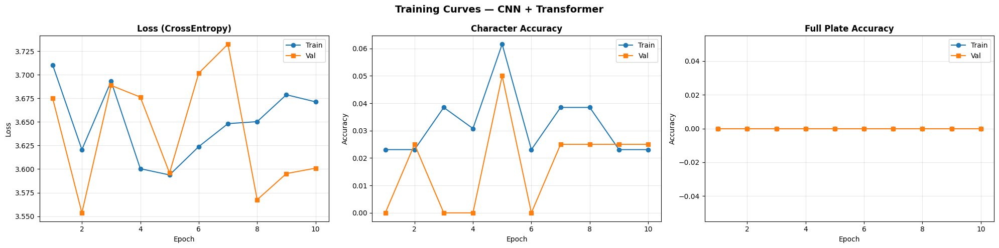

✅ Training curves saved


In [ ]:
epochs = range(1, NUM_EPOCHS + 1)
fig, axes = plt.subplots(1, 3, figsize=(20, 5))

axes[0].plot(epochs, history['train_loss'],     label='Train', marker='o')
axes[0].plot(epochs, history['val_loss'],       label='Val',   marker='s')
axes[0].set_title('Loss (CrossEntropy)', fontweight='bold')
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].plot(epochs, history['train_char_acc'], label='Train', marker='o')
axes[1].plot(epochs, history['val_char_acc'],   label='Val',   marker='s')
axes[1].set_title('Character Accuracy', fontweight='bold')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy')
axes[1].legend(); axes[1].grid(True, alpha=0.3)

axes[2].plot(epochs, history['train_plate_acc'],label='Train', marker='o')
axes[2].plot(epochs, history['val_plate_acc'],  label='Val',   marker='s')
axes[2].set_title('Full Plate Accuracy', fontweight='bold')
axes[2].set_xlabel('Epoch'); axes[2].set_ylabel('Accuracy')
axes[2].legend(); axes[2].grid(True, alpha=0.3)

plt.suptitle('Training Curves — CNN + Transformer', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/outputs/10_training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Training curves saved")

In [ ]:
# Load best model weights
model.load_state_dict(torch.load('/content/outputs/best_model.pt', map_location=device))

test_loss, test_char_acc, test_plate_acc = evaluate(
    model, test_loader, criterion, device, 'Test')


print("TEST SET RESULTS")

print(f"  Test Loss           : {test_loss:.4f}")
print(f"  Character Accuracy  : {test_char_acc*100:.2f}%")
print(f"  Full Plate Accuracy : {test_plate_acc*100:.2f}%")


TEST SET RESULTS
  Test Loss           : 3.7125
  Character Accuracy  : 3.33%
  Full Plate Accuracy : 0.00%


In [ ]:
import hashlib
import Levenshtein

def hash_plate(plate_str):
    return hashlib.md5(plate_str.encode()).hexdigest()

def find_duplicates(plate_list, lev_threshold=2):
    """
    Detect duplicate plates using:
    1. Exact match via MD5 hash
    2. Near-duplicate via Levenshtein distance
    """
    seen_hashes = {}
    exact_dups  = []
    near_dups   = []

    for plate in plate_list:
        h = hash_plate(plate)
        if h in seen_hashes:
            exact_dups.append((plate, seen_hashes[h]))
        else:
            seen_hashes[h] = plate

    plates = list(seen_hashes.values())
    for i in range(len(plates)):
        for j in range(i+1, len(plates)):
            dist = Levenshtein.distance(plates[i], plates[j])
            if 0 < dist <= lev_threshold:
                near_dups.append((plates[i], plates[j], dist))

    return exact_dups, near_dups

# Demo
sample_plates = [
    'MH12AB1234', 'MH12AB1234', 'MH12AB1235',
    'KA01CD5678', 'KA01CD5679', 'DL3CAF0001'
]
exact, near = find_duplicates(sample_plates, lev_threshold=2)

print("DUPLICATE DETECTION DEMO")
print(f"Input plates : {sample_plates}")
print(f"\nExact duplicates  : {exact}")
print(f"Near-duplicates   : {near}")

DUPLICATE DETECTION DEMO
Input plates : ['MH12AB1234', 'MH12AB1234', 'MH12AB1235', 'KA01CD5678', 'KA01CD5679', 'DL3CAF0001']

Exact duplicates  : [('MH12AB1234', 'MH12AB1234')]
Near-duplicates   : [('MH12AB1234', 'MH12AB1235', 1), ('KA01CD5678', 'KA01CD5679', 1)]


PARKING LOG (first 10 entries)
Plate          Zone       Timestamp              Action
------------------------------------------------------------
GJ01ZZ9999     Zone-C     2024-01-15 08:00:00    EXIT
GJ01ZZ9999     Zone-B     2024-01-15 08:15:00    ENTRY
MH12AB1234     Zone-B     2024-01-15 08:30:00    EXIT
MH12AB1234     Zone-B     2024-01-15 08:45:00    ENTRY
TN09XY4321     Zone-C     2024-01-15 09:00:00    EXIT
DL3CAF0001     Zone-B     2024-01-15 09:15:00    EXIT
DL3CAF0001     Zone-B     2024-01-15 09:30:00    EXIT
MH12AB1234     Zone-B     2024-01-15 09:45:00    ENTRY
KA01CD5678     Zone-D     2024-01-15 10:00:00    EXIT
DL3CAF0001     Zone-B     2024-01-15 10:15:00    EXIT

Zone Occupancy (ENTRY events):
  Zone-A: █ (1)
  Zone-B: █████ (5)
  Zone-D: █ (1)


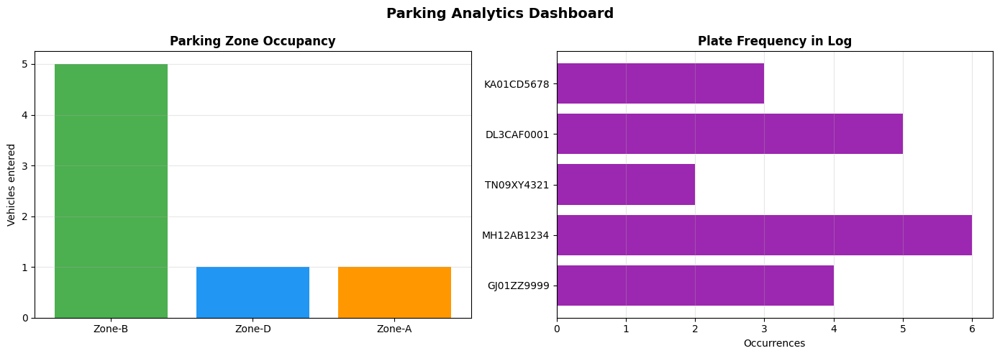

✅ Parking analytics done


In [ ]:
import datetime, random

# Simulate recognised plates with timestamps
def simulate_parking_log(plates, n=20):
    zones  = ['Zone-A', 'Zone-B', 'Zone-C', 'Zone-D']
    log    = []
    base   = datetime.datetime(2024, 1, 15, 8, 0, 0)
    for i in range(n):
        log.append({
            'plate'    : random.choice(plates),
            'zone'     : random.choice(zones),
            'timestamp': base + datetime.timedelta(minutes=i*15),
            'action'   : random.choice(['ENTRY', 'EXIT']),
        })
    return log

plates = ['MH12AB1234','KA01CD5678','DL3CAF0001',
          'TN09XY4321','GJ01ZZ9999']
log    = simulate_parking_log(plates)

print("PARKING LOG (first 10 entries)")
print(f"{'Plate':<14} {'Zone':<10} {'Timestamp':<22} {'Action'}")
print("-" * 60)
for entry in log[:10]:
    print(f"{entry['plate']:<14} {entry['zone']:<10} "
          f"{str(entry['timestamp']):<22} {entry['action']}")

# Zone occupancy
from collections import Counter
zone_counts = Counter(e['zone'] for e in log if e['action'] == 'ENTRY')
print(f"\nZone Occupancy (ENTRY events):")
for zone, count in sorted(zone_counts.items()):
    bar = '█' * count
    print(f"  {zone}: {bar} ({count})")

# Plot
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
zones_list  = list(zone_counts.keys())
zone_vals   = list(zone_counts.values())
axes[0].bar(zones_list, zone_vals, color=['#4CAF50','#2196F3','#FF9800','#F44336'])
axes[0].set_title('Parking Zone Occupancy', fontweight='bold')
axes[0].set_ylabel('Vehicles entered')
axes[0].grid(axis='y', alpha=0.3)

plate_freq = Counter(e['plate'] for e in log)
axes[1].barh(list(plate_freq.keys()), list(plate_freq.values()), color='#9C27B0')
axes[1].set_title('Plate Frequency in Log', fontweight='bold')
axes[1].set_xlabel('Occurrences')
axes[1].grid(axis='x', alpha=0.3)

plt.suptitle('Parking Analytics Dashboard', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('/content/outputs/11_parking_analytics.png', dpi=150, bbox_inches='tight')
plt.show()
print("✅ Parking analytics done")

In [ ]:
import xml.etree.ElementTree as ET

ann_files = (
    glob.glob('/content/dataset/**/*.xml', recursive=True) +
    glob.glob('/content/dataset/**/*.txt', recursive=True)
)
print(f"Annotation files found: {len(ann_files)}")

ok, bad = 0, 0
for f in ann_files[:15]:
    try:
        if f.endswith('.xml'):
            root = ET.parse(f).getroot()
            boxes = root.findall('.//bndbox')
            print(f"  ✅ {os.path.basename(f):30s} → {len(boxes)} box(es)")
        else:
            lines = open(f).readlines()
            print(f"  ✅ {os.path.basename(f):30s} → {len(lines)} line(s)")
        ok += 1
    except Exception as e:
        print(f"  ❌ {f}: {e}")
        bad += 1

print(f"\nVerified: {ok} valid | {bad} errors")

Annotation files found: 47
  ✅ dc_license_plates_0RRPJCID3RRLSFTI.xml → 1 box(es)
  ✅ dc_license_plates_2D9KWCA7PLD0NW31.xml → 1 box(es)
  ✅ dc_license_plates_3HE1J0YIRGRDENVO.xml → 1 box(es)
  ✅ dc_license_plates_VZUYOAPZ8633ZQTN.xml → 1 box(es)
  ✅ dc_bus_image_000033_XUH0eV452t.xml → 1 box(es)
  ✅ dc_license_plates_2DZ4YT4ZJ9XJZSO0.xml → 1 box(es)
  ✅ dc_license_plates_7L53OMODJOLUGUOE.xml → 1 box(es)
  ✅ dc_license_plates_3GKHBM5PWHYXHMTE.xml → 1 box(es)
  ✅ dc_bus_image_000039_9NispLHmAo.xml → 1 box(es)
  ✅ dc_license_plates_VTPRN3NAPF8MUGNF.xml → 1 box(es)
  ✅ dc_license_plates_W1W3000C6IAY3F1X.xml → 1 box(es)
  ✅ dc_license_plates_VYA8KOAVKLW6PJYK.xml → 1 box(es)
  ✅ dc_truck_image_001561_IEhCyPTs.xml → 1 box(es)
  ✅ dc_license_plates_0RBAQHKIXQMDFYZD.xml → 1 box(es)
  ✅ dc_auto_image_000021_bMXgvtud5K.xml → 6 box(es)

Verified: 15 valid | 0 errors
